### Optimized hyperparameter models - random forest 

In [34]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import operator
import time
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn import datasets  
from sklearn.ensemble import RandomForestClassifier
from numpy import argmax
from sklearn import metrics  
from sklearn.tree import plot_tree
from sklearn import tree
from sklearn.model_selection import GridSearchCV
from scipy.stats import randint
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import train_test_split

In [2]:
path = r'C:\Users\kshifera\Desktop\CF_Course\Specialization\Project\Data Sets'

In [3]:
#import the cleaned dataframe from Task 2.2
station = pd.read_csv(os.path.join(path, 'cleaned_dated.csv'))

In [4]:
station.head()

,Unnamed: 0,DATE,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,0,19600101,7,0.85,1.018,0.32,0.09,0.7,6.5,0.8,...,4.9,5,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9
1,1,19600102,6,0.84,1.018,0.36,1.05,1.1,6.1,3.3,...,5.0,7,0.91,1.0007,0.25,0.84,0.7,8.9,5.6,12.1
2,2,19600103,8,0.90,1.018,0.18,0.30,0.0,8.5,5.1,...,4.1,7,0.91,1.0096,0.17,0.08,0.1,10.5,8.1,12.9
3,3,19600104,3,0.92,1.018,0.58,0.00,4.1,6.3,3.8,...,2.3,7,0.86,1.0184,0.13,0.98,0.0,7.4,7.3,10.6
4,4,19600105,6,0.95,1.018,0.65,0.14,5.4,3.0,-0.7,...,4.3,3,0.80,1.0328,0.46,0.00,5.7,5.7,3.0,8.4


In [5]:
# drop 'Unnamed: 0' column
station = station.drop(['Unnamed: 0'], axis=1)

In [6]:
station.head()

,DATE,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,19600101,7,0.85,1.018,0.32,0.09,0.7,6.5,0.8,10.9,...,4.9,5,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9
1,19600102,6,0.84,1.018,0.36,1.05,1.1,6.1,3.3,10.1,...,5.0,7,0.91,1.0007,0.25,0.84,0.7,8.9,5.6,12.1
2,19600103,8,0.90,1.018,0.18,0.30,0.0,8.5,5.1,9.9,...,4.1,7,0.91,1.0096,0.17,0.08,0.1,10.5,8.1,12.9
3,19600104,3,0.92,1.018,0.58,0.00,4.1,6.3,3.8,10.6,...,2.3,7,0.86,1.0184,0.13,0.98,0.0,7.4,7.3,10.6
4,19600105,6,0.95,1.018,0.65,0.14,5.4,3.0,-0.7,6.0,...,4.3,3,0.80,1.0328,0.46,0.00,5.7,5.7,3.0,8.4


In [7]:
#import answers dataframe
picnic = pd.read_csv(os.path.join(path, 'Dataset-Answers-Weather_Prediction_Pleasant_Weather.csv'))

In [8]:
picnic.head()

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,19600101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,19600102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,19600103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,19600104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,19600105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


### Filter data into 1970s and 1980s, first for the weather data and then for the answers data frame

In [9]:
# filter weather data of the 1970s decade
station_70s = station[station['DATE'].astype(str).str.startswith('197')] 

In [10]:
station_70s

,DATE,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
3653,19700101,8,0.83,1.018,0.18,0.00,0.0,-3.6,-4.1,-2.4,...,-4.9,7,0.78,1.0156,0.28,0.18,0.6,3.2,-0.7,5.8
3654,19700102,5,0.77,1.018,0.18,0.00,0.0,-4.1,-5.3,-1.9,...,-1.2,6,0.93,1.0091,0.32,0.17,2.0,4.7,0.7,8.6
3655,19700103,3,0.76,1.018,0.66,0.00,5.9,-2.2,-7.5,3.8,...,-6.9,4,0.86,1.0048,0.34,0.20,1.7,5.4,2.6,8.1
3656,19700104,6,0.84,1.018,0.18,2.03,0.0,-0.8,-4.3,0.6,...,-3.6,1,0.74,1.0053,0.56,0.23,6.3,1.9,-0.2,3.9
3657,19700105,8,0.91,1.018,0.18,0.65,0.0,2.2,-0.1,8.1,...,-13.0,3,0.86,1.0047,0.49,0.17,4.4,2.2,-2.0,6.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7300,19791227,7,0.74,1.018,0.63,0.07,5.6,2.2,-0.3,4.6,...,2.0,7,0.78,0.9978,0.24,0.22,0.6,6.7,6.1,9.0
7301,19791228,7,0.85,1.018,0.32,0.10,0.8,3.5,0.5,9.6,...,2.4,4,0.81,1.0062,0.26,0.47,1.7,6.3,4.6,8.0
7302,19791229,7,0.79,1.018,0.30,0.29,0.6,3.7,1.5,5.7,...,2.4,5,0.74,1.0055,0.28,0.31,2.5,5.5,4.0,7.0
7303,19791230,6,0.87,1.018,0.39,1.14,1.5,2.2,0.5,4.7,...,2.4,4,0.82,1.0125,0.41,0.02,4.6,4.6,1.2,8.0


In [11]:
# drop the 'DATE' column
station_70s = station_70s.drop(['DATE'], axis=1)

In [12]:
station_70s.shape

(3652, 135)

In [13]:
# filter weather data of the 1980s decade
station_80s = station[station['DATE'].astype(str).str.startswith('198')] 

In [14]:
station_80s

,DATE,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
7305,19800101,6,0.83,1.0180,0.40,0.01,1.6,-0.8,-4.4,1.2,...,1.1,6,0.90,1.0130,0.17,0.05,0.0,4.4,2.1,6.0
7306,19800102,5,0.84,1.0180,0.34,0.09,0.9,-1.7,-4.0,0.6,...,-1.2,7,0.89,1.0195,0.12,1.48,0.0,6.4,1.0,11.5
7307,19800103,8,0.80,1.0180,0.44,0.07,2.0,-0.6,-3.7,1.3,...,-5.0,8,0.95,1.0058,0.13,0.60,0.0,9.2,6.2,12.2
7308,19800104,8,0.94,1.0180,0.18,0.43,0.0,-0.9,-2.2,2.2,...,-5.4,5,0.80,1.0034,0.30,0.50,1.5,7.7,5.8,9.2
7309,19800105,8,0.90,1.0180,0.25,0.26,0.2,3.0,0.5,5.3,...,0.2,7,0.79,1.0134,0.22,0.03,0.1,7.6,6.1,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10953,19891227,6,0.87,1.0157,0.49,0.00,4.0,-0.9,-2.4,1.8,...,4.0,6,0.79,1.0105,0.22,0.12,0.1,6.0,1.8,10.1
10954,19891228,3,0.84,1.0196,0.54,0.00,6.4,-1.1,-2.8,1.8,...,2.2,8,0.84,1.0134,0.18,0.05,0.3,9.3,7.5,11.0
10955,19891229,4,0.85,1.0224,0.52,0.00,5.5,-1.7,-4.5,1.3,...,0.4,8,0.86,1.0110,0.12,1.10,0.0,10.1,8.8,11.4
10956,19891230,0,0.83,1.0233,0.57,0.00,6.6,-2.1,-4.3,1.6,...,-0.5,8,0.84,1.0138,0.16,0.49,0.1,9.9,8.2,10.8


In [15]:
# drop the 'DATE' column
station_80s = station_80s.drop(['DATE'], axis=1)

In [16]:
station_80s.shape

(3653, 135)

In [17]:
# filter answers dataframe to the 1970s decade
picnic_70s = picnic[station['DATE'].astype(str).str.startswith('197')] 

In [18]:
picnic_70s

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
3653,19700101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3654,19700102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3655,19700103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3656,19700104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3657,19700105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7300,19791227,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7301,19791228,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7302,19791229,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7303,19791230,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [19]:
# drop the 'DATE' column
picnic_70s = picnic_70s.drop(['DATE'], axis=1)

In [20]:
picnic_70s.shape

(3652, 15)

In [21]:
# filter answers dataframe to the 1980s decade
picnic_80s = picnic[station['DATE'].astype(str).str.startswith('198')] 

In [22]:
picnic_80s

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
7305,19800101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7306,19800102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7307,19800103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7308,19800104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7309,19800105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10953,19891227,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10954,19891228,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10955,19891229,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10956,19891230,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [23]:
# drop the 'DATE' column
picnic_80s = picnic_80s.drop(['DATE'], axis=1)

In [24]:
picnic_80s.shape

(3653, 15)

### Create Matrices

In [25]:
# Combine 15 columns in answers data frame for 1970s into single column
y70 = picnic_70s.max(axis=1)


In [26]:
# correct shape
y70 = y70.to_numpy().reshape(-1)
y70.shape

(3652,)

In [27]:
# Combine 15 columns in answers data frame for 1980s into single column
y80 = picnic_80s.max(axis=1)

In [28]:
# correct shape
y80 = y80.to_numpy().reshape(-1)
y80.shape

(3653,)

In [29]:
# X matrix for 1970s
X70 = station_70s.to_numpy()

In [30]:
# X matric for 1980s
X80 = station_80s.to_numpy()

In [31]:
# Check shapes for 1970s
print(X70.shape)
print(y70.shape)

(3652, 135)
(3652,)


In [32]:
# Check shapes for 1980s
print(X80.shape)
print(y80.shape)

(3653, 135)
(3653,)


In [35]:
# Split data into training and test data sets for 1990s
X_train70, X_test70, y_train70, y_test70 = train_test_split(X70, y70, random_state=42)

In [36]:
# Check shapes
print(X_train70.shape, y_train70.shape)
print(X_test70.shape, y_test70.shape)

(2739, 135) (2739,)
(913, 135) (913,)


In [37]:
# Split data into training and test data sets for 1990s
X_train80, X_test80, y_train80, y_test80 = train_test_split(X80, y80, random_state=42)

In [38]:
# Check shapes
print(X_train80.shape, y_train80.shape)
print(X_test80.shape, y_test80.shape)

(2739, 135) (2739,)
(914, 135) (914,)


### Random search by decade

#### 1970s

In [40]:
# Random search cv
rs_space70={'max_depth':list(np.arange(10, 100, step=10)) + [None],
              'n_estimators':np.arange(10, 500, step=50),
              'max_features':randint(1,7),
              'criterion':['gini','entropy'],
              'min_samples_leaf':randint(1,4),
              'min_samples_split':np.arange(2, 10, step=2)
         }

In [41]:
# creating a RF classifier
clf70= RandomForestClassifier()

In [43]:
start = time.time()
rf_random70 = RandomizedSearchCV(clf70, rs_space70, n_iter=200, scoring='accuracy', verbose=3, n_jobs=-1, cv=3) #500
model_random70 = rf_random70.fit(X_train70, y_train70)
print('Search took %s minutes' % ((time.time() - start)/60))

Fitting 3 folds for each of 200 candidates, totalling 600 fits
Search took 3.5711884021759035 minutes


In [44]:
# random search results
print('Best RANDOM search hyperparameters are: '+str(model_random70.best_params_))
print('Best RANDOM search score is: '+str(model_random70.best_score_))

Best RANDOM search hyperparameters are: {'criterion': 'entropy', 'max_depth': 20, 'max_features': 6, 'min_samples_leaf': 2, 'min_samples_split': 6, 'n_estimators': 260}
Best RANDOM search score is: 0.9536327126688572


In [45]:
# creating a RF classifier with the best results from above
clf70_New = RandomForestClassifier(n_estimators = 260, max_depth=20, max_features=6, min_samples_leaf=2, min_samples_split=6, criterion = 'entropy')  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf70_New.fit(X_train70, y_train70)

RandomForestClassifier(criterion='entropy', max_depth=20, max_features=6,
                       min_samples_leaf=2, min_samples_split=6,
                       n_estimators=260)

In [46]:
# performing predictions on the test dataset
y_pred70 = clf70_New.predict(X_test70)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test70, y_pred70))

Model Accuracy:  0.9386637458926615


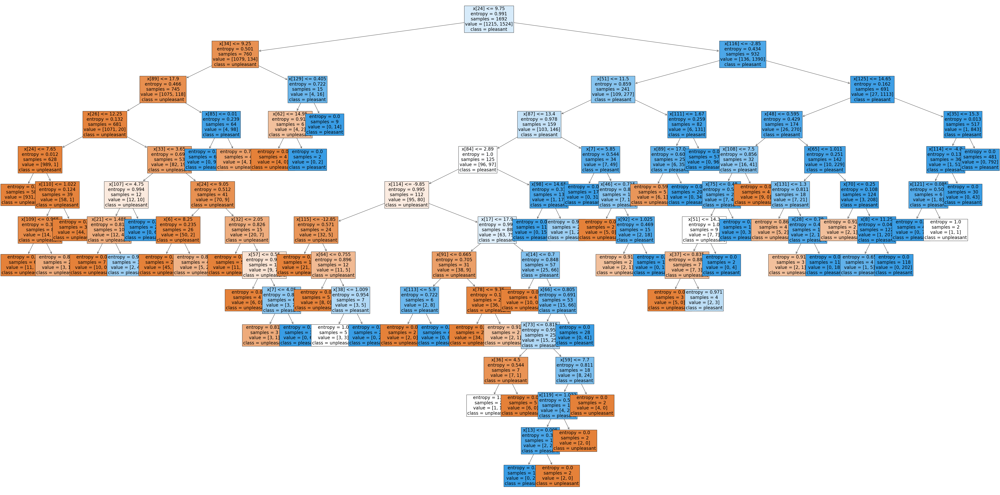

In [47]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf70_New.estimators_[15], fontsize = 20, class_names=['unpleasant', 'pleasant'], filled=True);

In [48]:
#Feature Importance

np.set_printoptions(threshold=np.inf)
importance70 = clf70_New.feature_importances_
print(importance70)


[0.00064083 0.00124915 0.         0.0058832  0.00088968 0.00128098
 0.03046907 0.01114185 0.03337925 0.00096844 0.00359032 0.00208475
 0.00791574 0.00283292 0.00353236 0.02604076 0.01222047 0.02345758
 0.00077944 0.0017285  0.00197222 0.01132045 0.00072963 0.00348692
 0.03397613 0.01488124 0.05435938 0.00050709 0.00126346 0.00134099
 0.00623461 0.00081175 0.0010417  0.00628627 0.00573803 0.01958606
 0.00073558 0.00115198 0.00139561 0.00908528 0.00105877 0.00110306
 0.00956487 0.00470592 0.02879902 0.00062038 0.00251127 0.00104109
 0.00746562 0.00075411 0.00133073 0.00813291 0.00174476 0.01387692
 0.00076567 0.00188059 0.00120137 0.00899114 0.00110938 0.00139285
 0.03643268 0.00845814 0.03182452 0.00089198 0.00203108 0.00147586
 0.00322002 0.00114389 0.00200503 0.04023775 0.0093441  0.04311723
 0.00072472 0.00101572 0.00131923 0.00236508 0.0009298  0.00106343
 0.01395797 0.00358882 0.02295438 0.00188131 0.00426737 0.00215022
 0.01181153 0.00164082 0.00603012 0.0293294  0.01273721 0.0482

In [49]:
# Reshape the feature

newimportance70 = importance70.reshape(-1,15,9)
print(newimportance70.shape)
newimportance70

(1, 15, 9)


array([[[0.00064083, 0.00124915, 0.        , 0.0058832 , 0.00088968,
         0.00128098, 0.03046907, 0.01114185, 0.03337925],
        [0.00096844, 0.00359032, 0.00208475, 0.00791574, 0.00283292,
         0.00353236, 0.02604076, 0.01222047, 0.02345758],
        [0.00077944, 0.0017285 , 0.00197222, 0.01132045, 0.00072963,
         0.00348692, 0.03397613, 0.01488124, 0.05435938],
        [0.00050709, 0.00126346, 0.00134099, 0.00623461, 0.00081175,
         0.0010417 , 0.00628627, 0.00573803, 0.01958606],
        [0.00073558, 0.00115198, 0.00139561, 0.00908528, 0.00105877,
         0.00110306, 0.00956487, 0.00470592, 0.02879902],
        [0.00062038, 0.00251127, 0.00104109, 0.00746562, 0.00075411,
         0.00133073, 0.00813291, 0.00174476, 0.01387692],
        [0.00076567, 0.00188059, 0.00120137, 0.00899114, 0.00110938,
         0.00139285, 0.03643268, 0.00845814, 0.03182452],
        [0.00089198, 0.00203108, 0.00147586, 0.00322002, 0.00114389,
         0.00200503, 0.04023775, 0.0093441

In [50]:
# Sum the values across the last dimension to get one observation for each weather station
perstation70 = np.sum(newimportance70[0], axis=1)

# Check shape
print( perstation70.shape)
print(perstation70)

(15,)
[0.084934   0.08264335 0.12323391 0.04280996 0.05760009 0.03747779
 0.09205632 0.10346694 0.04791913 0.11814264 0.06811141 0.04594779
 0.02315193 0.04182805 0.03067669]


In [51]:
# Create list for weather stations
weather_stations = ['BASEL', 'BELGRADE', 'BUDAPEST', 'DEBILT', 'DUSSELDORF', 
                    'HEATHROW', 'KASSEL', 'LJUBLJANA', 'MAASTRICHT', 'MADRID', 
                    'MUNCHENB', 'OSLO', 'SONNBLICK', 'STOCKHOLM', 'VALENTIA']

In [52]:
# Create a dataframe to associate weather stations with their importances
df70 = pd.DataFrame({
    'Weather Station': weather_stations,
    'Importance': perstation70
})

In [53]:
# Sort by importance 
df70 = df70.sort_values(by='Importance',ascending=False)
print(df70)

   Weather Station  Importance
2         BUDAPEST    0.123234
9           MADRID    0.118143
7        LJUBLJANA    0.103467
6           KASSEL    0.092056
0            BASEL    0.084934
1         BELGRADE    0.082643
10        MUNCHENB    0.068111
4       DUSSELDORF    0.057600
8       MAASTRICHT    0.047919
11            OSLO    0.045948
3           DEBILT    0.042810
13       STOCKHOLM    0.041828
5         HEATHROW    0.037478
14        VALENTIA    0.030677
12       SONNBLICK    0.023152


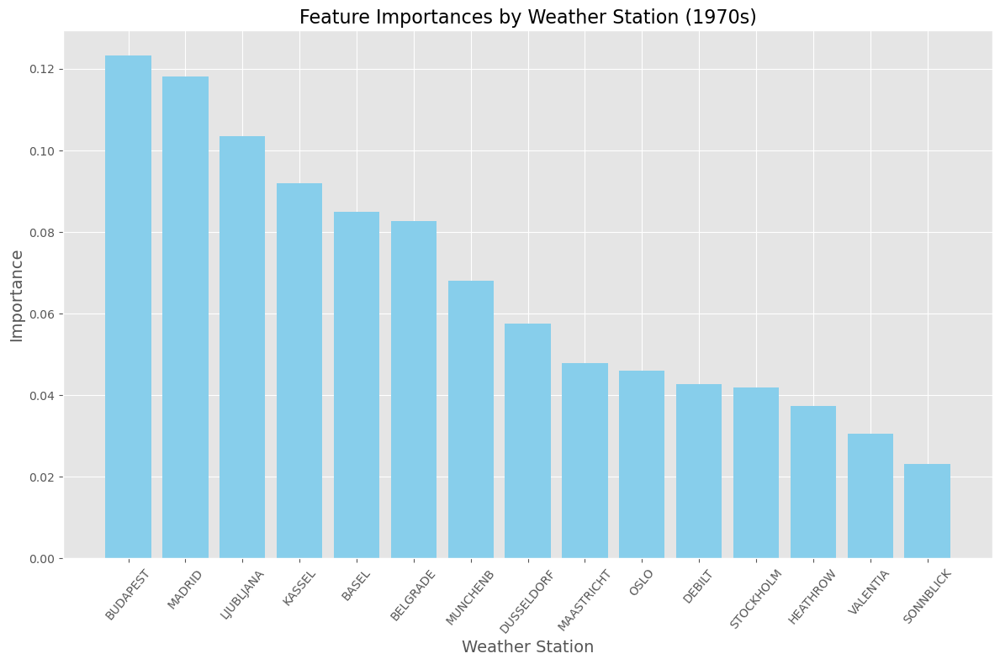

In [54]:
# Plot the importances

plt.style.use('ggplot')
plt70 = plt.figure(figsize=(12, 8))
plt.bar(df70['Weather Station'], df70['Importance'], color='skyblue')
plt.xticks(rotation=50, ha='center')
plt.xlabel('Weather Station', fontsize=14)
plt.ylabel('Importance', fontsize=14)
plt.title('Feature Importances by Weather Station (1970s)', fontsize=16)
plt.tight_layout()
plt.show()

#### 1980s

In [55]:
# Random search cv
rs_space80={'max_depth':list(np.arange(10, 100, step=10)) + [None],
              'n_estimators':np.arange(10, 500, step=50),
              'max_features':randint(1,7),
              'criterion':['gini','entropy'],
              'min_samples_leaf':randint(1,4),
              'min_samples_split':np.arange(2, 10, step=2)
         }

In [56]:
# creating a RF classifier
clf80= RandomForestClassifier()

In [57]:
start = time.time()
rf_random80 = RandomizedSearchCV(clf80, rs_space80, n_iter=200, scoring='accuracy', verbose=3, n_jobs=-1, cv=3) #500
model_random80 = rf_random80.fit(X_train80, y_train80)
print('Search took %s minutes' % ((time.time() - start)/60))

Fitting 3 folds for each of 200 candidates, totalling 600 fits
Search took 4.144858769575754 minutes


In [44]:
# random search results
print('Best RANDOM search hyperparameters are: '+str(model_random70.best_params_))
print('Best RANDOM search score is: '+str(model_random70.best_score_))

Best RANDOM search hyperparameters are: {'criterion': 'entropy', 'max_depth': 20, 'max_features': 6, 'min_samples_leaf': 2, 'min_samples_split': 6, 'n_estimators': 260}
Best RANDOM search score is: 0.9536327126688572


In [58]:
# creating a RF classifier with the best results from above
clf80_New = RandomForestClassifier(n_estimators = 260, max_depth=20, max_features=6, min_samples_leaf=2, min_samples_split=6, criterion = 'entropy')  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf80_New.fit(X_train80, y_train80)

RandomForestClassifier(criterion='entropy', max_depth=20, max_features=6,
                       min_samples_leaf=2, min_samples_split=6,
                       n_estimators=260)

In [59]:
# performing predictions on the test dataset
y_pred80 = clf80_New.predict(X_test80)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test80, y_pred80))

Model Accuracy:  0.9562363238512035


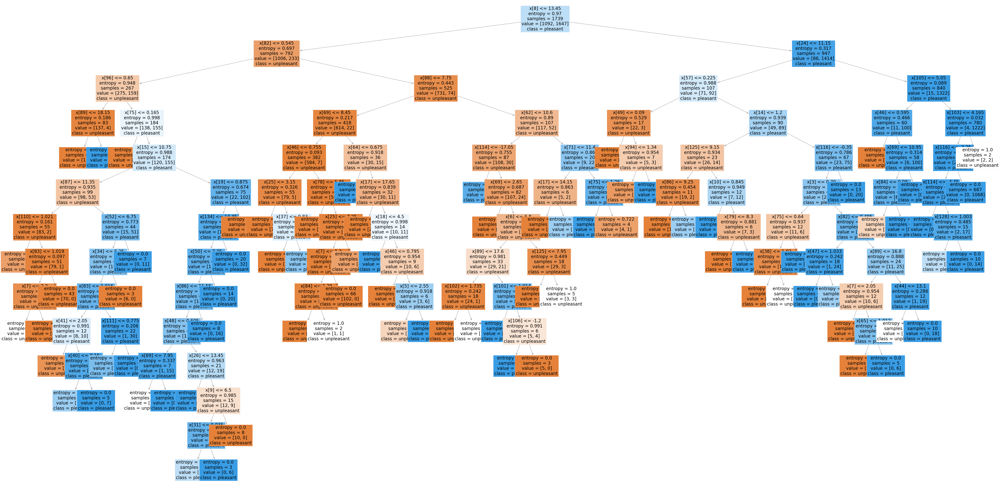

In [60]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf80_New.estimators_[15], fontsize = 20, class_names=['unpleasant', 'pleasant'], filled=True);

In [61]:
#Feature Importance

np.set_printoptions(threshold=np.inf)
importance80 = clf80_New.feature_importances_
print(importance80)


[0.00050517 0.00153045 0.00150875 0.002725   0.00094878 0.00103929
 0.02162407 0.00667603 0.01531105 0.00114774 0.00197934 0.00146166
 0.01081751 0.00088375 0.00333753 0.03386928 0.0257738  0.03328016
 0.00093299 0.00227883 0.00177907 0.01123311 0.00104592 0.00276633
 0.04395941 0.03175218 0.02245255 0.00063151 0.00109471 0.00145235
 0.00299631 0.00065609 0.00086543 0.00555043 0.00413314 0.01438599
 0.00051611 0.00134056 0.00114538 0.00539319 0.000929   0.00110665
 0.01708098 0.00591178 0.0105866  0.00058167 0.00162867 0.00151267
 0.00419709 0.00061547 0.00106321 0.01422107 0.00525555 0.01593612
 0.00090711 0.00139009 0.00139753 0.00651023 0.00098019 0.00087456
 0.0216204  0.0114127  0.03840972 0.00084732 0.00243192 0.00138191
 0.00870864 0.00124498 0.00288813 0.04319446 0.02128648 0.02866829
 0.00057331 0.00108668 0.00121118 0.00389499 0.00110015 0.00128328
 0.01037277 0.00851075 0.00687902 0.00165117 0.00441135 0.00310104
 0.01145751 0.00214279 0.0048914  0.03398886 0.01461711 0.0693

In [62]:
# Reshape the feature

newimportance80 = importance80.reshape(-1,15,9)
print(newimportance80.shape)
newimportance80

(1, 15, 9)


array([[[0.00050517, 0.00153045, 0.00150875, 0.002725  , 0.00094878,
         0.00103929, 0.02162407, 0.00667603, 0.01531105],
        [0.00114774, 0.00197934, 0.00146166, 0.01081751, 0.00088375,
         0.00333753, 0.03386928, 0.0257738 , 0.03328016],
        [0.00093299, 0.00227883, 0.00177907, 0.01123311, 0.00104592,
         0.00276633, 0.04395941, 0.03175218, 0.02245255],
        [0.00063151, 0.00109471, 0.00145235, 0.00299631, 0.00065609,
         0.00086543, 0.00555043, 0.00413314, 0.01438599],
        [0.00051611, 0.00134056, 0.00114538, 0.00539319, 0.000929  ,
         0.00110665, 0.01708098, 0.00591178, 0.0105866 ],
        [0.00058167, 0.00162867, 0.00151267, 0.00419709, 0.00061547,
         0.00106321, 0.01422107, 0.00525555, 0.01593612],
        [0.00090711, 0.00139009, 0.00139753, 0.00651023, 0.00098019,
         0.00087456, 0.0216204 , 0.0114127 , 0.03840972],
        [0.00084732, 0.00243192, 0.00138191, 0.00870864, 0.00124498,
         0.00288813, 0.04319446, 0.0212864

In [63]:
# Sum the values across the last dimension to get one observation for each weather station
perstation80 = np.sum(newimportance80[0], axis=1)

# Check shape
print( perstation80.shape)
print(perstation80)

(15,)
[0.05186861 0.11255078 0.11820037 0.03176596 0.04401024 0.04501153
 0.08350253 0.11065214 0.03491212 0.14562591 0.0491448  0.06222072
 0.02177897 0.06320424 0.02555108]


In [64]:
# Create a dataframe to associate weather stations with their importances
df80 = pd.DataFrame({
    'Weather Station': weather_stations,
    'Importance': perstation80
})

In [65]:
# Sort by importance 
df80 = df80.sort_values(by='Importance',ascending=False)
print(df80)

   Weather Station  Importance
9           MADRID    0.145626
2         BUDAPEST    0.118200
1         BELGRADE    0.112551
7        LJUBLJANA    0.110652
6           KASSEL    0.083503
13       STOCKHOLM    0.063204
11            OSLO    0.062221
0            BASEL    0.051869
10        MUNCHENB    0.049145
5         HEATHROW    0.045012
4       DUSSELDORF    0.044010
8       MAASTRICHT    0.034912
3           DEBILT    0.031766
14        VALENTIA    0.025551
12       SONNBLICK    0.021779


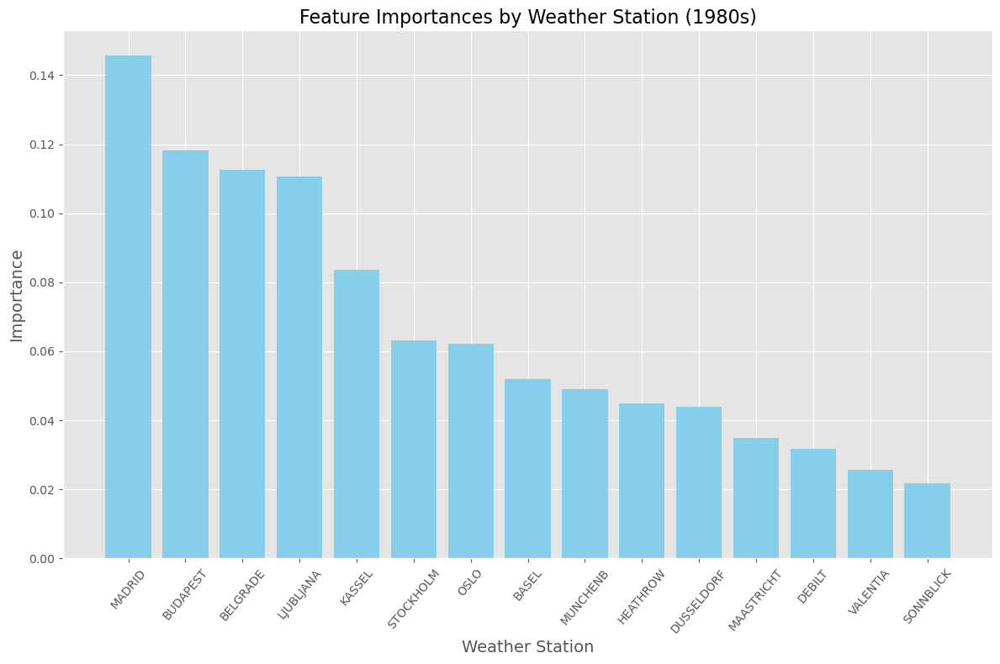

In [67]:
# Plot the importances

plt.style.use('ggplot')
plt70 = plt.figure(figsize=(12, 8))
plt.bar(df80['Weather Station'], df80['Importance'], color='skyblue')
plt.xticks(rotation=50, ha='center')
plt.xlabel('Weather Station', fontsize=14)
plt.ylabel('Importance', fontsize=14)
plt.title('Feature Importances by Weather Station (1980s)', fontsize=16)
plt.tight_layout()
plt.show()

### Random Search by Weather Stations

### Madrid 

In [68]:
# filter weather data of Madrid weather station
MadridW = station[station.columns[station.columns.astype(str).str.startswith('MADRID')] ]
MadridW

,MADRID_cloud_cover,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max
0,6,0.92,1.0260,0.53,0.00,1.4,7.6,4.4,10.8
1,7,0.86,1.0254,0.46,0.00,0.9,9.8,7.4,12.2
2,5,0.90,1.0287,0.63,0.00,2.3,8.6,6.4,10.8
3,0,0.75,1.0281,1.16,0.00,8.7,10.3,4.5,16.1
4,2,0.64,1.0269,1.10,0.00,7.8,12.1,8.2,16.0
...,...,...,...,...,...,...,...,...,...
22945,8,0.52,1.0204,1.89,0.12,5.3,20.0,16.2,23.9
22946,8,0.51,1.0221,1.89,0.12,3.9,19.1,14.7,23.5
22947,8,0.46,1.0186,1.89,0.12,8.1,19.0,15.4,22.6
22948,5,0.66,1.0186,1.89,0.12,3.1,15.7,13.1,18.3


In [69]:
MadridW.shape

(22950, 9)

In [70]:
# Filter answers dataset to include Madrid only
MadridA = picnic[picnic.columns[picnic.columns.astype(str).str.startswith('MADRID')]]
MadridA


,MADRID_pleasant_weather
0,0
1,0
2,0
3,0
4,0
...,...
22945,0
22946,0
22947,0
22948,0


In [71]:
MadridA.shape

(22950, 1)

In [72]:
# Create y matrix
yM = MadridA.max(axis=1)

In [73]:
# Ensure correct shape
yM = yM.to_numpy().reshape(-1)
yM.shape

(22950,)

In [74]:
# Create X matrix
XM = MadridW.to_numpy()

In [75]:
XM.shape

(22950, 9)

In [76]:
# Split data into training and testing sets
X_trainM, X_testM, y_trainM, y_testM = train_test_split(XM, yM, random_state=42)

In [77]:
# Check shapes
print(X_trainM.shape, y_trainM.shape)
print(X_testM.shape, y_testM.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [78]:
# Random search cv
rs_spaceM={'max_depth':list(np.arange(10, 100, step=10)) + [None],
              'n_estimators':np.arange(10, 500, step=50),
              'max_features':randint(1,7),
              'criterion':['gini','entropy'],
              'min_samples_leaf':randint(1,4),
              'min_samples_split':np.arange(2, 10, step=2)
         }

In [79]:
# creating a RF classifier
clfM= RandomForestClassifier()

In [80]:
start = time.time()
rf_randomM = RandomizedSearchCV(clfM, rs_spaceM, n_iter=200, scoring='accuracy', verbose=3, n_jobs=-1, cv=3) #500
model_randomM = rf_randomM.fit(X_trainM, y_trainM)
print('Search took %s minutes' % ((time.time() - start)/60))

Fitting 3 folds for each of 200 candidates, totalling 600 fits
Search took 6.118263375759125 minutes


In [81]:
# random search results
print('Best RANDOM search hyperparameters are: '+str(model_randomM.best_params_))
print('Best RANDOM search score is: '+str(model_randomM.best_score_))

Best RANDOM search hyperparameters are: {'criterion': 'entropy', 'max_depth': 90, 'max_features': 4, 'min_samples_leaf': 3, 'min_samples_split': 6, 'n_estimators': 210}
Best RANDOM search score is: 1.0


In [82]:
# creating a RF classifier with the best results from above
clfM_New = RandomForestClassifier(n_estimators = 210, max_depth=90, max_features=4, min_samples_leaf=3, min_samples_split=6, criterion = 'entropy')  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clfM_New.fit(X_trainM, y_trainM)

RandomForestClassifier(criterion='entropy', max_depth=90, max_features=4,
                       min_samples_leaf=3, min_samples_split=6,
                       n_estimators=210)

In [83]:
# performing predictions on the test dataset
y_predM = clfM_New.predict(X_testM)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_testM, y_predM))

Model Accuracy:  1.0


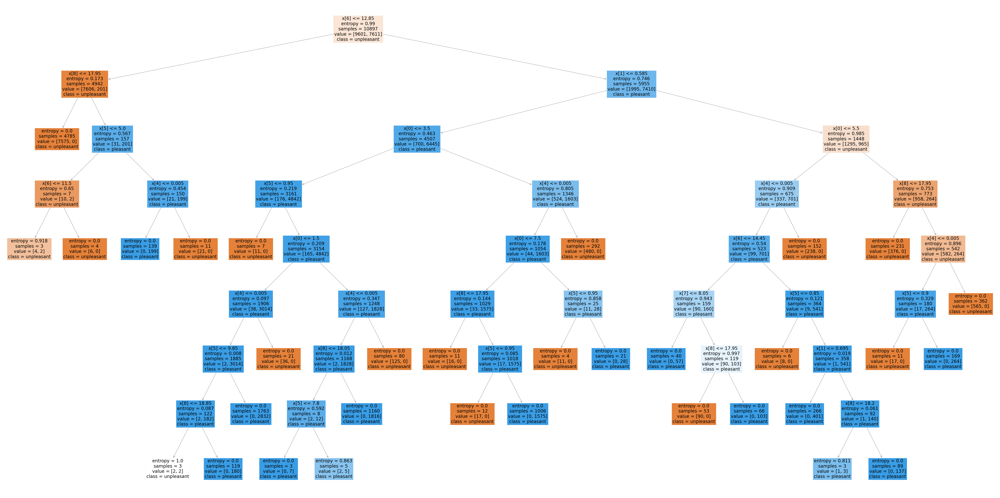

In [84]:
fig = plt.figure(figsize=(80,40))
plot_tree(clfM_New.estimators_[15], fontsize = 20, class_names=['unpleasant', 'pleasant'], filled=True);

In [85]:
#Feature Importance

np.set_printoptions(threshold=np.inf)
importanceM = clfM_New.feature_importances_
print(importanceM)


[0.01462858 0.01457739 0.00191611 0.05728995 0.25429164 0.07524998
 0.18537469 0.03235743 0.36431423]


In [87]:
# Create list for observation measurements
measurements = [
    'cloud_cover', 'humidity', 'pressure', 'global_radiation', 
    'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max'
]

In [88]:
# Create a dataframe to associate observation measurements with their importances
IpM = pd.DataFrame({
    'Measurement': measurements,
    'Importance': importanceM
})

In [89]:
# Sort by importance 
IpM = IpM.sort_values(by='Importance', ascending=False)
print("Variable Importance:")
print(importanceM)

Variable Importance:
[0.01462858 0.01457739 0.00191611 0.05728995 0.25429164 0.07524998
 0.18537469 0.03235743 0.36431423]


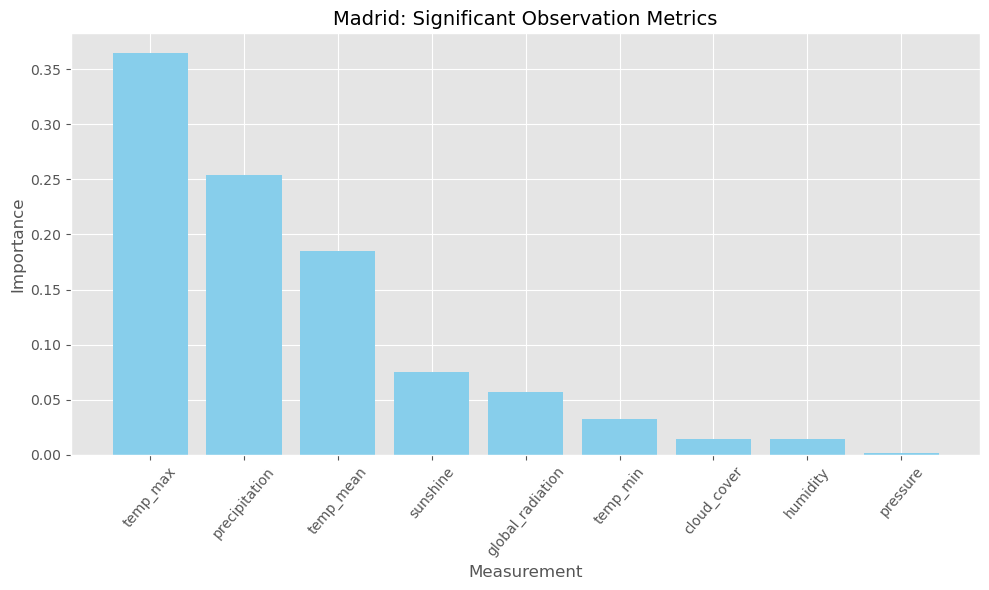

In [90]:
# Plot the importances

plt.style.use('ggplot')
plt_3 = plt.figure(figsize=(10, 6))
plt.bar(IpM['Measurement'], IpM['Importance'], color='skyblue')
plt.xticks(rotation=50, ha='center')
plt.xlabel('Measurement', fontsize=12)
plt.ylabel('Importance', fontsize=12)
plt.title("Madrid: Significant Observation Metrics", fontsize=14)
plt.tight_layout()
plt.show()

### Budapest

In [94]:
# filter weather data of Madrid weather station
BudapestW = station[station.columns[station.columns.astype(str).str.startswith('BUDAPEST')] ]
BudapestW

,BUDAPEST_cloud_cover,BUDAPEST_humidity,BUDAPEST_pressure,BUDAPEST_global_radiation,BUDAPEST_precipitation,BUDAPEST_sunshine,BUDAPEST_temp_mean,BUDAPEST_temp_min,BUDAPEST_temp_max
0,4,0.67,1.017,0.44,0.01,2.3,2.4,-0.4,5.1
1,4,0.67,1.017,0.18,0.31,0.0,2.3,1.4,3.1
2,4,0.67,1.017,0.30,0.00,0.6,2.7,1.7,5.3
3,4,0.67,1.017,0.19,0.00,0.0,2.0,0.4,4.4
4,4,0.67,1.017,0.19,0.00,0.0,2.5,1.1,5.3
...,...,...,...,...,...,...,...,...,...
22945,4,0.67,1.017,1.41,0.14,5.4,11.7,7.9,16.2
22946,4,0.67,1.017,1.41,0.14,5.4,11.7,7.9,16.2
22947,4,0.67,1.017,1.41,0.14,5.4,11.7,7.9,16.2
22948,4,0.67,1.017,1.41,0.14,5.4,11.7,7.9,16.2


In [95]:
BudapestW.shape

(22950, 9)

In [96]:
# Filter answers dataset to include Madrid only
BudapestA = picnic[picnic.columns[picnic.columns.astype(str).str.startswith('BUDAPEST')]]
BudapestA


,BUDAPEST_pleasant_weather
0,0
1,0
2,0
3,0
4,0
...,...
22945,0
22946,0
22947,0
22948,0


In [97]:
BudapestA.shape

(22950, 1)

In [98]:
# Create y matrix
yB = BudapestA.max(axis=1)

In [99]:
# Ensure correct shape
yB = yB.to_numpy().reshape(-1)
yB.shape

(22950,)

In [100]:
# Create X matrix
XB = BudapestW.to_numpy()

In [101]:
XB.shape

(22950, 9)

In [102]:
# Split data into training and testing sets
X_trainB, X_testB, y_trainB, y_testB = train_test_split(XB, yB, random_state=42)

In [103]:
# Check shapes
print(X_trainB.shape, y_trainB.shape)
print(X_testB.shape, y_testB.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [104]:
# Random search cv
rs_spaceB={'max_depth':list(np.arange(10, 100, step=10)) + [None],
              'n_estimators':np.arange(10, 500, step=50),
              'max_features':randint(1,7),
              'criterion':['gini','entropy'],
              'min_samples_leaf':randint(1,4),
              'min_samples_split':np.arange(2, 10, step=2)
         }

In [105]:
# creating a RF classifier
clfB= RandomForestClassifier()

In [106]:
start = time.time()
rf_randomB = RandomizedSearchCV(clfB, rs_spaceB, n_iter=200, scoring='accuracy', verbose=3, n_jobs=-1, cv=3) #500
model_randomB = rf_randomB.fit(X_trainB, y_trainB)
print('Search took %s minutes' % ((time.time() - start)/60))

Fitting 3 folds for each of 200 candidates, totalling 600 fits
Search took 6.3002587834994 minutes


In [107]:
# random search results
print('Best RANDOM search hyperparameters are: '+str(model_randomM.best_params_))
print('Best RANDOM search score is: '+str(model_randomM.best_score_))

Best RANDOM search hyperparameters are: {'criterion': 'entropy', 'max_depth': 90, 'max_features': 4, 'min_samples_leaf': 3, 'min_samples_split': 6, 'n_estimators': 210}
Best RANDOM search score is: 1.0


In [108]:
# creating a RF classifier with the best results from above
clfB_New = RandomForestClassifier(n_estimators = 210, max_depth=90, max_features=4, min_samples_leaf=3, min_samples_split=6, criterion = 'entropy')  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clfB_New.fit(X_trainB, y_trainB)

RandomForestClassifier(criterion='entropy', max_depth=90, max_features=4,
                       min_samples_leaf=3, min_samples_split=6,
                       n_estimators=210)

In [109]:
# performing predictions on the test dataset
y_predB = clfB_New.predict(X_testB)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_testB, y_predB))

Model Accuracy:  1.0


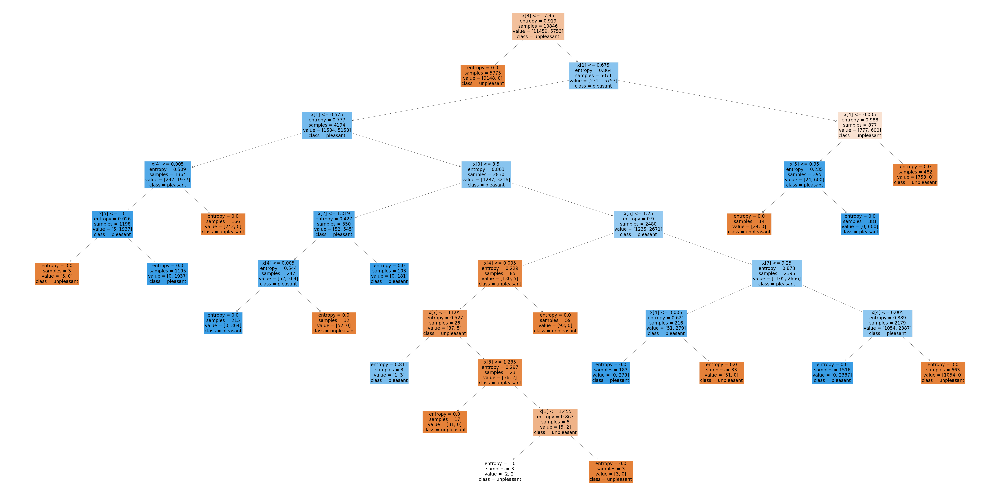

In [110]:
fig = plt.figure(figsize=(80,40))
plot_tree(clfB_New.estimators_[15], fontsize = 20, class_names=['unpleasant', 'pleasant'], filled=True);

In [111]:
#Feature Importance

np.set_printoptions(threshold=np.inf)
importanceB = clfB_New.feature_importances_
print(importanceB)


[0.00889096 0.00113383 0.00186701 0.01696941 0.36702666 0.04335357
 0.16709353 0.06082351 0.33284153]


In [112]:
# Create a dataframe to associate observation measurements with their importances
IpB = pd.DataFrame({
    'Measurement': measurements,
    'Importance': importanceB
})

In [113]:
# Sort by importance 
IpB = IpB.sort_values(by='Importance', ascending=False)
print("Variable Importance:")
print(importanceB)

Variable Importance:
[0.00889096 0.00113383 0.00186701 0.01696941 0.36702666 0.04335357
 0.16709353 0.06082351 0.33284153]


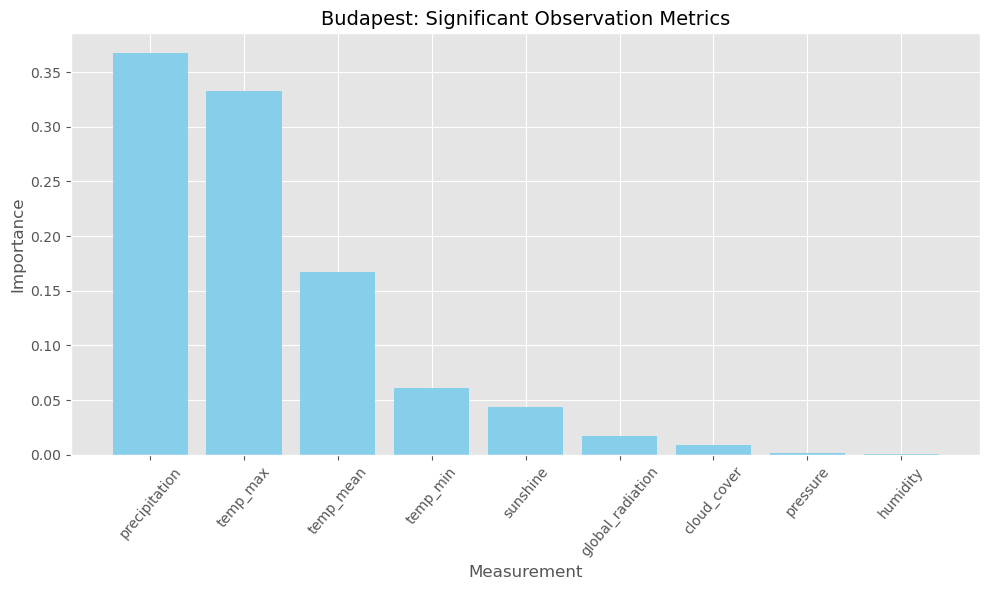

In [114]:
# Plot the importances

plt.style.use('ggplot')
plt_3 = plt.figure(figsize=(10, 6))
plt.bar(IpB['Measurement'], IpB['Importance'], color='skyblue')
plt.xticks(rotation=50, ha='center')
plt.xlabel('Measurement', fontsize=12)
plt.ylabel('Importance', fontsize=12)
plt.title("Budapest: Significant Observation Metrics", fontsize=14)
plt.tight_layout()
plt.show()

### Ljubljana

In [115]:
# filter weather data of Madrid weather station
LjubljanaW = station[station.columns[station.columns.astype(str).str.startswith('LJUBLJANA')] ]
LjubljanaW

,LJUBLJANA_cloud_cover,LJUBLJANA_humidity,LJUBLJANA_pressure,LJUBLJANA_global_radiation,LJUBLJANA_precipitation,LJUBLJANA_sunshine,LJUBLJANA_temp_mean,LJUBLJANA_temp_min,LJUBLJANA_temp_max
0,8,1.00,1.0173,0.20,0.00,0.0,-0.6,-1.9,0.5
1,6,0.94,1.0173,0.56,0.13,3.2,2.1,-1.3,5.5
2,8,0.96,1.0173,0.20,0.12,0.0,4.6,0.9,6.3
3,6,0.94,1.0173,0.49,0.00,2.2,3.2,1.0,7.0
4,7,0.94,1.0173,0.20,0.00,0.0,3.6,0.4,4.8
...,...,...,...,...,...,...,...,...,...
22945,4,0.80,1.0289,1.35,0.37,5.9,14.7,12.1,21.1
22946,3,0.82,1.0291,1.35,0.37,4.5,12.9,9.8,19.8
22947,3,0.81,1.0270,1.35,0.37,5.1,13.2,10.2,20.7
22948,3,0.77,1.0238,1.35,0.37,5.7,14.0,10.0,23.1


In [116]:
LjubljanaW.shape

(22950, 9)

In [117]:
# Filter answers dataset to include Madrid only
LjubljanaA = picnic[picnic.columns[picnic.columns.astype(str).str.startswith('LJUBLJANA')]]
LjubljanaA


,LJUBLJANA_pleasant_weather
0,0
1,0
2,0
3,0
4,0
...,...
22945,0
22946,0
22947,0
22948,0


In [118]:
LjubljanaA.shape

(22950, 1)

In [119]:
# Create y matrix
yL = LjubljanaA.max(axis=1)

In [120]:
# Ensure correct shape
yL = yL.to_numpy().reshape(-1)
yL.shape

(22950,)

In [121]:
# Create X matrix
XL = LjubljanaW.to_numpy()

In [122]:
XL.shape

(22950, 9)

In [123]:
# Split data into training and testing sets
X_trainL, X_testL, y_trainL, y_testL = train_test_split(XL, yL, random_state=42)

In [124]:
# Check shapes
print(X_trainL.shape, y_trainL.shape)
print(X_testL.shape, y_testL.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [125]:
# Random search cv
rs_spaceL={'max_depth':list(np.arange(10, 100, step=10)) + [None],
              'n_estimators':np.arange(10, 500, step=50),
              'max_features':randint(1,7),
              'criterion':['gini','entropy'],
              'min_samples_leaf':randint(1,4),
              'min_samples_split':np.arange(2, 10, step=2)
         }

In [126]:
# creating a RF classifier
clfL= RandomForestClassifier()

In [127]:
start = time.time()
rf_randomL = RandomizedSearchCV(clfL, rs_spaceL, n_iter=200, scoring='accuracy', verbose=3, n_jobs=-1, cv=3) #500
model_randomL = rf_randomL.fit(X_trainL, y_trainL)
print('Search took %s minutes' % ((time.time() - start)/60))

Fitting 3 folds for each of 200 candidates, totalling 600 fits
Search took 6.349141224225362 minutes


In [128]:
# random search results
print('Best RANDOM search hyperparameters are: '+str(model_randomM.best_params_))
print('Best RANDOM search score is: '+str(model_randomL.best_score_))

Best RANDOM search hyperparameters are: {'criterion': 'entropy', 'max_depth': 90, 'max_features': 4, 'min_samples_leaf': 3, 'min_samples_split': 6, 'n_estimators': 210}
Best RANDOM search score is: 1.0


In [129]:
# creating a RF classifier with the best results from above
clfL_New = RandomForestClassifier(n_estimators = 210, max_depth=90, max_features=4, min_samples_leaf=3, min_samples_split=6, criterion = 'entropy')  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clfL_New.fit(X_trainL, y_trainL)

RandomForestClassifier(criterion='entropy', max_depth=90, max_features=4,
                       min_samples_leaf=3, min_samples_split=6,
                       n_estimators=210)

In [130]:
# performing predictions on the test dataset
y_predL = clfL_New.predict(X_testL)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_testL, y_predL))

Model Accuracy:  1.0


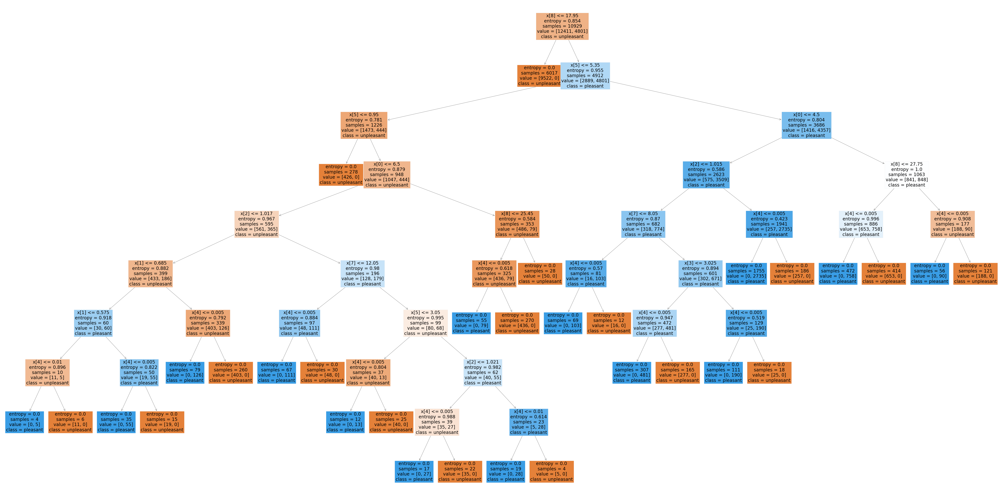

In [131]:
fig = plt.figure(figsize=(80,40))
plot_tree(clfL_New.estimators_[15], fontsize = 20, class_names=['unpleasant', 'pleasant'], filled=True);

In [132]:
#Feature Importance

np.set_printoptions(threshold=np.inf)
importanceL = clfL_New.feature_importances_
print(importanceL)


[0.03145079 0.00566048 0.00354765 0.04289876 0.38464603 0.04715272
 0.12582105 0.01296927 0.34585326]


In [133]:
# Create a dataframe to associate observation measurements with their importances
IpL = pd.DataFrame({
    'Measurement': measurements,
    'Importance': importanceL
})

In [134]:
# Sort by importance 
IpL = IpL.sort_values(by='Importance', ascending=False)
print("Variable Importance:")
print(importanceL)

Variable Importance:
[0.03145079 0.00566048 0.00354765 0.04289876 0.38464603 0.04715272
 0.12582105 0.01296927 0.34585326]


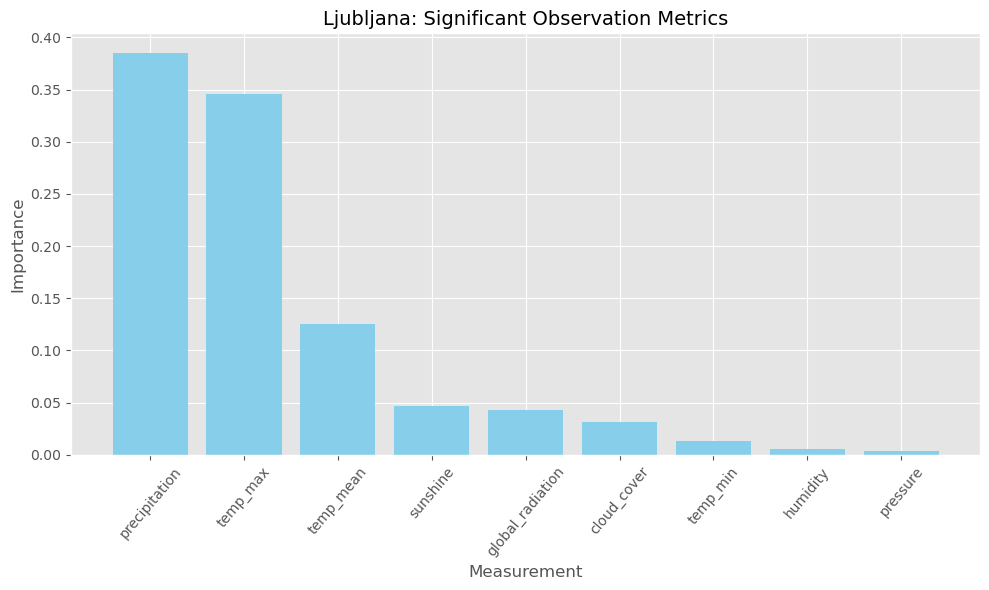

In [136]:
# Plot the importances

plt.style.use('ggplot')
plt_3 = plt.figure(figsize=(10, 6))
plt.bar(IpL['Measurement'], IpL['Importance'], color='skyblue')
plt.xticks(rotation=50, ha='center')
plt.xlabel('Measurement', fontsize=12)
plt.ylabel('Importance', fontsize=12)
plt.title("Ljubljana: Significant Observation Metrics", fontsize=14)
plt.tight_layout()
plt.show()